## 1.1: Convoltuions from Scratch

In [170]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.transform import rotate
from scipy import signal
import cv2

/Users/zanemogannam/Desktop/classes/180/zanemo109.github.io/venv/lib/python3.13/site-packages/skimage/color/colorconv.py:984: RuntimeWarning: divide by zero encountered in matmul
  return rgb @ coeffs
/Users/zanemogannam/Desktop/classes/180/zanemo109.github.io/venv/lib/python3.13/site-packages/skimage/color/colorconv.py:984: RuntimeWarning: overflow encountered in matmul
  return rgb @ coeffs
/Users/zanemogannam/Desktop/classes/180/zanemo109.github.io/venv/lib/python3.13/site-packages/skimage/color/colorconv.py:984: RuntimeWarning: invalid value encountered in matmul
  return rgb @ coeffs


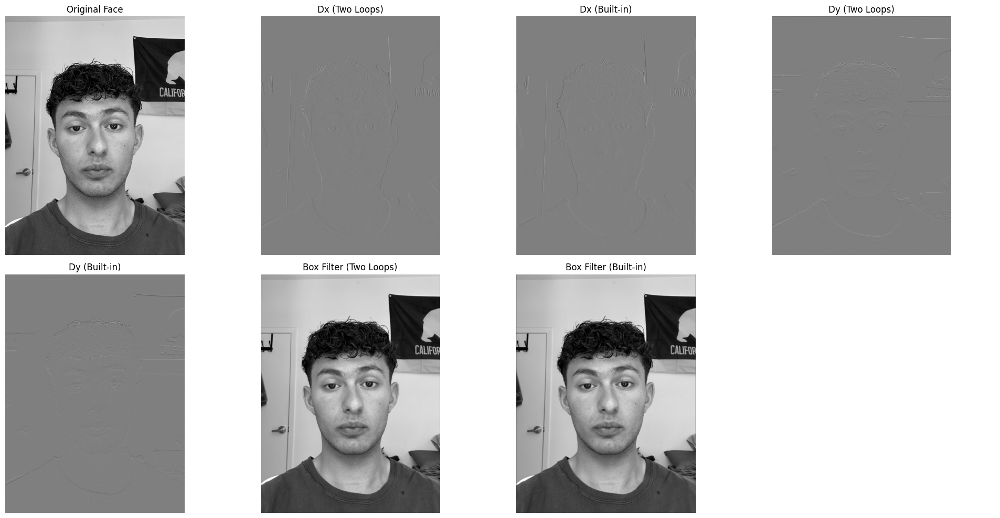

In [171]:
Dx = np.array([[1, 0, -1]])
Dy = np.array([[1], [0], [-1]])

def convolve_four_loops(image, kernel):
    im_h, im_w = image.shape
    k_h, k_w = kernel.shape

    pad_h = k_h // 2
    pad_w = k_w // 2

    padded_image = np.zeros((im_h + 2 * pad_h, im_w + 2 * pad_w))
    padded_image[pad_h:pad_h + im_h, pad_w:pad_w + im_w] = image

    output = np.zeros_like(image)

    for i in range(im_h):
        for j in range(im_w):
            for ki in range(k_h):
                for kj in range(k_w):
                    output[i, j] += padded_image[i + ki, j + kj] * kernel[ki, kj]

    return output

def convolve_two_loops(image, kernel):
    im_h, im_w = image.shape
    k_h, k_w = kernel.shape

    pad_h = k_h // 2
    pad_w = k_w // 2

    padded_image = np.zeros((im_h + 2 * pad_h, im_w + 2 * pad_w))
    padded_image[pad_h:pad_h + im_h, pad_w:pad_w + im_w] = image

    output = np.zeros_like(image)

    for i in range(im_h):
        for j in range(im_w):
            region = padded_image[i:i+k_h, j:j+k_w]
            output[i, j] = np.sum(region * kernel)

    return output

def built_in_convolve(image, kernel):
    return signal.convolve2d(image, kernel, mode='same')

box_filter = np.ones((9, 9)) / 81

face = io.imread('../images/face.png')
face = color.rgb2gray(face)
face = np.rot90(face, k=-1)

face_dx_two = convolve_two_loops(face, Dx)
face_dy_two = convolve_two_loops(face, Dy)

face_dx_built_in = built_in_convolve(face, Dx)
face_dy_built_in = built_in_convolve(face, Dy)

face_blur_two = convolve_two_loops(face, box_filter)
face_blur_built_in = built_in_convolve(face, box_filter)


fig, axes = plt.subplots(2, 4, figsize=(20, 10))

axes[0, 0].imshow(face, cmap='gray')
axes[0, 0].set_title('Original Face')
axes[0, 0].axis('off')

axes[0, 1].imshow(face_dx_two, cmap='gray')
axes[0, 1].set_title('Dx (Two Loops)')
axes[0, 1].axis('off')

axes[0, 2].imshow(face_dx_built_in, cmap='gray')
axes[0, 2].set_title('Dx (Built-in)')
axes[0, 2].axis('off')

axes[0, 3].imshow(face_dy_two, cmap='gray')
axes[0, 3].set_title('Dy (Two Loops)')
axes[0, 3].axis('off')

# Row 2: Dy and Box filter results
axes[1, 0].imshow(face_dy_built_in, cmap='gray')
axes[1, 0].set_title('Dy (Built-in)')
axes[1, 0].axis('off')

axes[1, 1].imshow(face_blur_two, cmap='gray')
axes[1, 1].set_title('Box Filter (Two Loops)')
axes[1, 1].axis('off')

axes[1, 2].imshow(face_blur_built_in, cmap='gray')
axes[1, 2].set_title('Box Filter (Built-in)')
axes[1, 2].axis('off')

axes[1, 3].axis('off')

plt.tight_layout()
plt.show()



## 1.2: Finite Difference Operators

/Users/zanemogannam/Desktop/classes/180/zanemo109.github.io/venv/lib/python3.13/site-packages/skimage/color/colorconv.py:984: RuntimeWarning: divide by zero encountered in matmul
  return rgb @ coeffs
/Users/zanemogannam/Desktop/classes/180/zanemo109.github.io/venv/lib/python3.13/site-packages/skimage/color/colorconv.py:984: RuntimeWarning: overflow encountered in matmul
  return rgb @ coeffs
/Users/zanemogannam/Desktop/classes/180/zanemo109.github.io/venv/lib/python3.13/site-packages/skimage/color/colorconv.py:984: RuntimeWarning: invalid value encountered in matmul
  return rgb @ coeffs


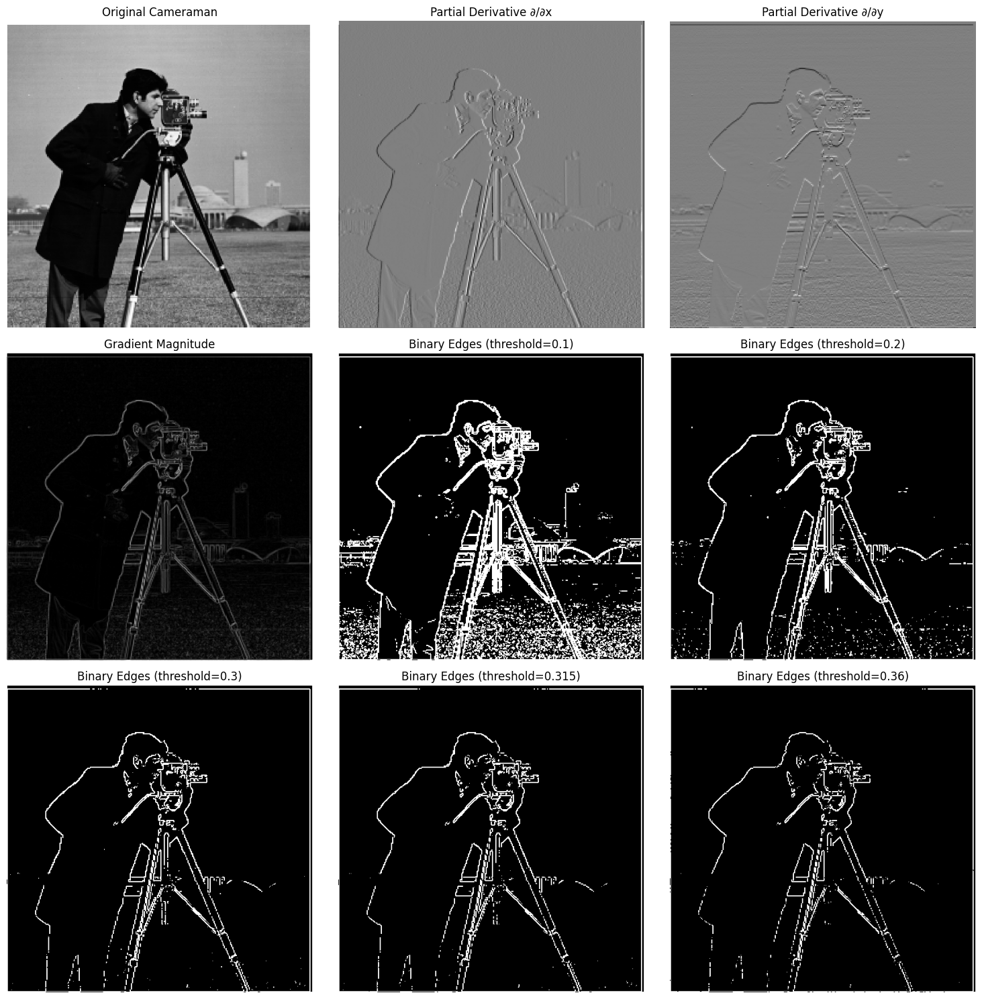

In [172]:
cameraman = io.imread('../images/cameraman.png')
cameraman_rgb = cameraman[:, :, :3]
cameraman = color.rgb2gray(cameraman_rgb)

partial_x = built_in_convolve(cameraman, Dx)
partial_y = built_in_convolve(cameraman, Dy)

gradient_magnitude = np.sqrt(partial_x**2 + partial_y**2)

threshold_values = [0.1, 0.2, 0.3, 0.315, 0.36]
binary_edges = []

for thresh in threshold_values:
    binary_edge = gradient_magnitude > thresh
    binary_edges.append(binary_edge)

fig, axes = plt.subplots(3, 3, figsize=(15, 15))

axes[0, 0].imshow(cameraman, cmap='gray')
axes[0, 0].set_title('Original Cameraman')
axes[0, 0].axis('off')

axes[0, 1].imshow(partial_x, cmap='gray')
axes[0, 1].set_title('Partial Derivative ∂/∂x')
axes[0, 1].axis('off')

axes[0, 2].imshow(partial_y, cmap='gray')
axes[0, 2].set_title('Partial Derivative ∂/∂y')
axes[0, 2].axis('off')


axes[1, 0].imshow(gradient_magnitude, cmap='gray')
axes[1, 0].set_title('Gradient Magnitude')
axes[1, 0].axis('off')

axes[1, 1].imshow(binary_edges[0], cmap='gray')
axes[1, 1].set_title(f'Binary Edges (threshold={threshold_values[0]})')
axes[1, 1].axis('off')

axes[1, 2].imshow(binary_edges[1], cmap='gray')
axes[1, 2].set_title(f'Binary Edges (threshold={threshold_values[1]})')
axes[1, 2].axis('off')

axes[2, 0].imshow(binary_edges[2], cmap='gray')
axes[2, 0].set_title(f'Binary Edges (threshold={threshold_values[2]})')
axes[2, 0].axis('off')

axes[2, 1].imshow(binary_edges[3], cmap='gray')
axes[2, 1].set_title(f'Binary Edges (threshold={threshold_values[3]})')
axes[2, 1].axis('off')

axes[2, 2].imshow(binary_edges[4], cmap='gray')
axes[2, 2].set_title(f'Binary Edges (threshold={threshold_values[4]})')
axes[2, 2].axis('off')

plt.tight_layout()
plt.show()



## 1.3: Derivative of Gaussian Filter

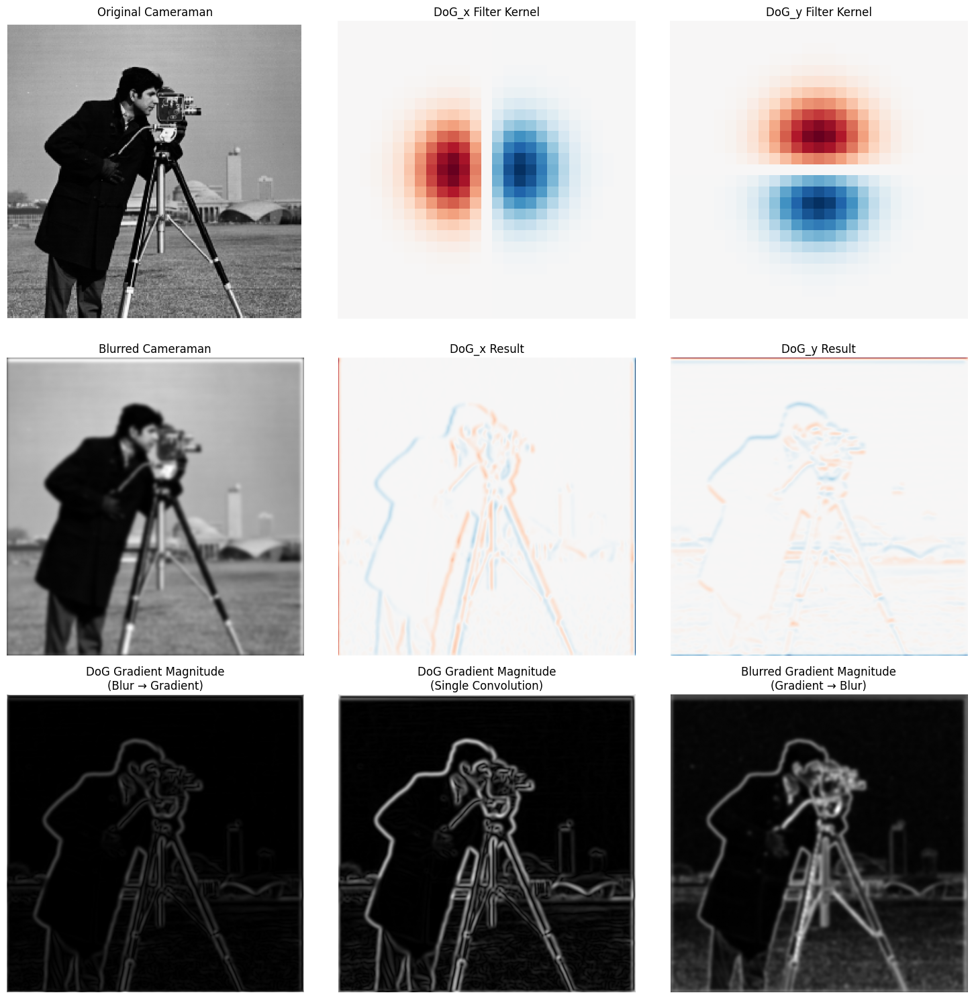

In [186]:
kernel_size = 27
std = 3

gaussian_1d = cv2.getGaussianKernel(kernel_size, std)
gaussian_2d = np.outer(gaussian_1d, gaussian_1d)

# Create Derivative of Gaussian (DoG) filters by convolving Gaussian with derivative operators
DoG_x = signal.convolve2d(gaussian_2d, Dx, mode='same')
DoG_y = signal.convolve2d(gaussian_2d, Dy, mode='same')

# Method 1: Blur first, then take derivatives (two convolutions)
blurred_cameraman = built_in_convolve(cameraman, gaussian_2d)
dog_x = built_in_convolve(blurred_cameraman, Dx)
dog_y = built_in_convolve(blurred_cameraman, Dy)
dog_gradient_magnitude = np.sqrt(dog_x**2 + dog_y**2)

# Method 2: Use DoG filters directly (single convolution)
dog_x_direct = built_in_convolve(cameraman, DoG_x)
dog_y_direct = built_in_convolve(cameraman, DoG_y)
dog_gradient_magnitude_direct = np.sqrt(dog_x_direct**2 + dog_y_direct**2)

# Method 3: Previous approach (gradient first, then blur)
gradient_x = built_in_convolve(cameraman, Dx)
gradient_y = built_in_convolve(cameraman, Dy)
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
blurred_gradient_magnitude = built_in_convolve(gradient_magnitude, gaussian_2d)

# Verify DoG methods give same result
difference_dog_methods = np.abs(dog_gradient_magnitude - dog_gradient_magnitude_direct)

# Compare DoG vs previous approach
difference_approaches = np.abs(dog_gradient_magnitude - blurred_gradient_magnitude)

# Visualize the DoG results
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# Row 1: Original image, DoG filter kernels
axes[0, 0].imshow(cameraman, cmap='gray')
axes[0, 0].set_title('Original Cameraman')
axes[0, 0].axis('off')

axes[0, 1].imshow(DoG_x, cmap='RdBu_r', vmin=-np.max(np.abs(DoG_x)), vmax=np.max(np.abs(DoG_x)))
axes[0, 1].set_title('DoG_x Filter Kernel')
axes[0, 1].axis('off')

axes[0, 2].imshow(DoG_y, cmap='RdBu_r', vmin=-np.max(np.abs(DoG_y)), vmax=np.max(np.abs(DoG_y)))
axes[0, 2].set_title('DoG_y Filter Kernel')
axes[0, 2].axis('off')

# Row 2: Blurred image, derivative results
axes[1, 0].imshow(blurred_cameraman, cmap='gray')
axes[1, 0].set_title('Blurred Cameraman')
axes[1, 0].axis('off')

axes[1, 1].imshow(dog_x, cmap='RdBu_r', vmin=-np.max(np.abs(dog_x)), vmax=np.max(np.abs(dog_x)))
axes[1, 1].set_title('DoG_x Result')
axes[1, 1].axis('off')

axes[1, 2].imshow(dog_y, cmap='RdBu_r', vmin=-np.max(np.abs(dog_y)), vmax=np.max(np.abs(dog_y)))
axes[1, 2].set_title('DoG_y Result')
axes[1, 2].axis('off')

# Row 3: Compare gradient magnitude results
axes[2, 0].imshow(dog_gradient_magnitude, cmap='gray')
axes[2, 0].set_title('DoG Gradient Magnitude\n(Blur → Gradient)')
axes[2, 0].axis('off')

axes[2, 1].imshow(dog_gradient_magnitude_direct, cmap='gray')
axes[2, 1].set_title('DoG Gradient Magnitude\n(Single Convolution)')
axes[2, 1].axis('off')

axes[2, 2].imshow(blurred_gradient_magnitude, cmap='gray')
axes[2, 2].set_title('Blurred Gradient Magnitude\n(Gradient → Blur)')
axes[2, 2].axis('off')

plt.tight_layout()
plt.show()

## 2.1: Image Sharpening

(np.float64(-0.5), np.float64(299.5), np.float64(299.5), np.float64(-0.5))

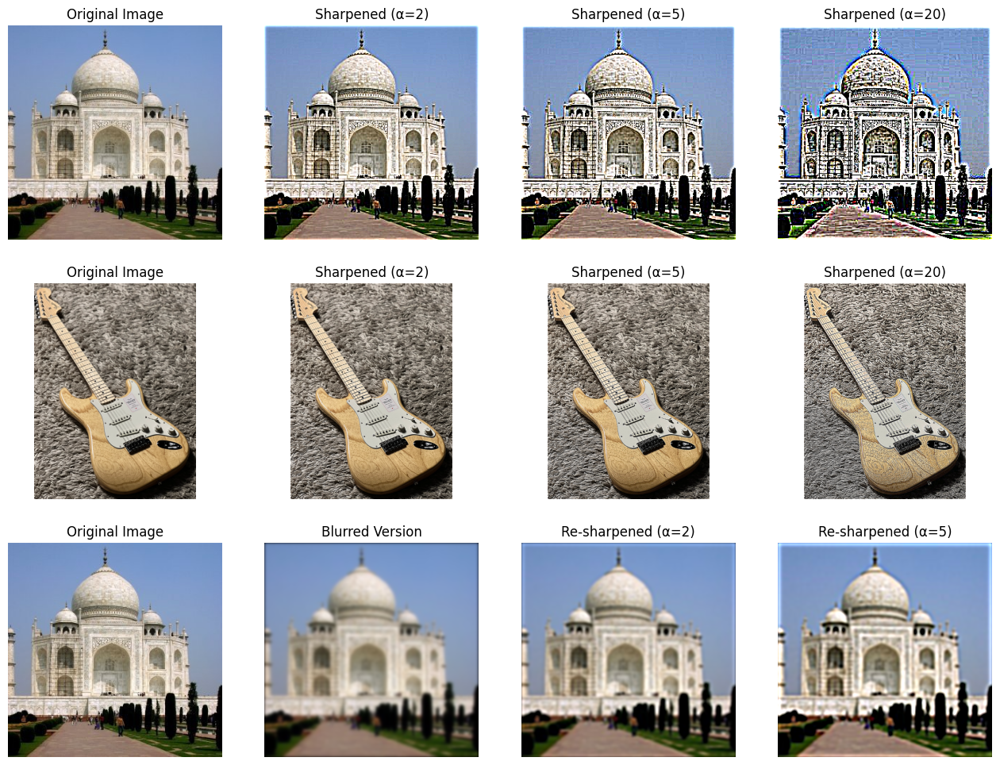

In [174]:
taj = io.imread('../images/taj.jpg')
strat = io.imread('../images/stratocaster.webp')

taj = taj.astype(np.float32) / 255.0
strat = strat.astype(np.float32) / 255.0

kernel_size = 15
sigma = 2

gaussian_1d = cv2.getGaussianKernel(kernel_size, sigma)
gaussian_2d = np.outer(gaussian_1d, gaussian_1d)

def unsharp_mask(image, gaussian_kernel, alpha):
    sharpened = np.zeros_like(image)
    blurred = np.zeros_like(image)
    high_frequencies = np.zeros_like(image)

    for channel in range(3):
        blurred[:, :, channel] = built_in_convolve(image[:, :, channel], gaussian_kernel)
        high_frequencies[:, :, channel] = image[:, :, channel] - blurred[:, :, channel]
        sharpened[:, :, channel] = image[:, :, channel] + alpha * high_frequencies[:, :, channel]

    sharpened = np.clip(sharpened, 0, 1)
    return sharpened, blurred, high_frequencies

alphas = [2, 5, 20]

taj_results = []
strat_results = []

for alpha in alphas:
    taj_sharp, _, _ = unsharp_mask(taj, gaussian_2d, alpha)
    strat_sharp, _, _ = unsharp_mask(strat, gaussian_2d, alpha)
    taj_results.append(taj_sharp)
    strat_results.append(strat_sharp)

taj_blurred = np.zeros_like(taj)
for channel in range(3):
    taj_blurred[:, :, channel] = built_in_convolve(taj[:, :, channel], gaussian_2d)

taj_recovered_2, _, _ = unsharp_mask(taj_blurred, gaussian_2d, 2)
taj_recovered_5, _, _ = unsharp_mask(taj_blurred, gaussian_2d, 5)

fig, axes = plt.subplots(3, 4, figsize=(16, 12))

axes[0, 0].imshow(taj)
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

for i, (alpha, result) in enumerate(zip(alphas, taj_results)):
    axes[0, i+1].imshow(result)
    axes[0, i+1].set_title(f'Sharpened (α={alpha})')
    axes[0, i+1].axis('off')

axes[1, 0].imshow(strat)
axes[1, 0].set_title('Original Image')
axes[1, 0].axis('off')

for i, (alpha, result) in enumerate(zip(alphas, strat_results)):
    axes[1, i+1].imshow(result)
    axes[1, i+1].set_title(f'Sharpened (α={alpha})')
    axes[1, i+1].axis('off')

axes[2, 0].imshow(taj)
axes[2, 0].set_title('Original Image')
axes[2, 0].axis('off')

axes[2, 1].imshow(taj_blurred)
axes[2, 1].set_title('Blurred Version')
axes[2, 1].axis('off')

axes[2, 2].imshow(taj_recovered_2)
axes[2, 2].set_title('Re-sharpened (α=2)')
axes[2, 2].axis('off')

axes[2, 3].imshow(taj_recovered_5)
axes[2, 3].set_title('Re-sharpened (α=5)')
axes[2, 3].axis('off')



## 2.2: Hybrid Images

/var/folders/nc/dkzh6vs93fq3m59dzmkbrq1h0000gn/T/ipykernel_68644/693190470.py:89: FutureWarning: `imshow` is deprecated since version 0.25 and will be removed in version 0.27. Please use `matplotlib`, `napari`, etc. to visualize images.
  io.imshow(hybrid3)


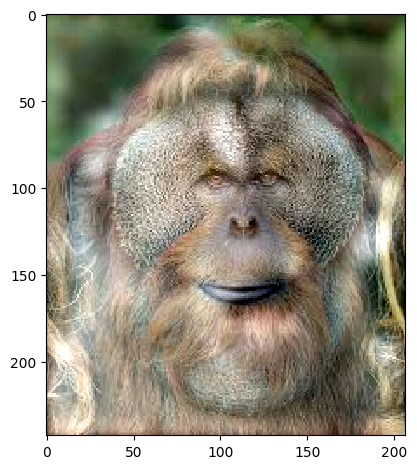

In [175]:
rohan_aligned = io.imread('../images/rohan_aligned.jpeg')
bron_aligned = io.imread('../images/bron_aligned.jpeg')

rohan = rohan_aligned.astype(np.float32) / 255.0
bron = bron_aligned.astype(np.float32) / 255.0

derek_aligned = io.imread('../images/derek_aligned.jpeg')
nutmeg_aligned = io.imread('../images/nutmeg_aligned.jpeg')

derek = derek_aligned.astype(np.float32) / 255.0
nutmeg = nutmeg_aligned.astype(np.float32) / 255.0

monkey_aligned = io.imread('../images/monkey_aligned.jpeg')
orangutan_aligned = io.imread('../images/orangutan.jpeg')

monkey = monkey_aligned.astype(np.float32) / 255.0
orangutan = orangutan_aligned.astype(np.float32) / 255.0

target_height_monkey = min(monkey.shape[0], orangutan.shape[0])
target_width_monkey = min(monkey.shape[1], orangutan.shape[1])

monkey_resized = resize(monkey, (target_height_monkey, target_width_monkey), anti_aliasing=True)
orangutan_resized = resize(orangutan, (target_height_monkey, target_width_monkey), anti_aliasing=True)


target_height_rohan = min(rohan.shape[0], bron.shape[0])
target_width_rohan = min(rohan.shape[1], bron.shape[1])

from skimage.transform import resize
rohan_resized = resize(rohan, (target_height_rohan, target_width_rohan), anti_aliasing=True)
bron_resized = resize(bron, (target_height_rohan, target_width_rohan), anti_aliasing=True)

target_height_derek = min(derek.shape[0], nutmeg.shape[0])
target_width_derek = min(derek.shape[1], nutmeg.shape[1])

derek_resized = resize(derek, (target_height_derek, target_width_derek), anti_aliasing=True)
nutmeg_resized = resize(nutmeg, (target_height_derek, target_width_derek), anti_aliasing=True)

low_freq_sigma_rohan = 3
high_freq_sigma_rohan = 9
kernel_size_rohan = 19

low_gaussian_1d_rohan = cv2.getGaussianKernel(kernel_size_rohan, low_freq_sigma_rohan)
low_gaussian_2d_rohan = np.outer(low_gaussian_1d_rohan, low_gaussian_1d_rohan)

high_gaussian_1d_rohan = cv2.getGaussianKernel(kernel_size_rohan, high_freq_sigma_rohan)
high_gaussian_2d_rohan = np.outer(high_gaussian_1d_rohan, high_gaussian_1d_rohan)

low_freq_sigma_derek = 5
high_freq_sigma_derek = 10
kernel_size_derek = 21

low_gaussian_1d_derek = cv2.getGaussianKernel(kernel_size_derek, low_freq_sigma_derek)
low_gaussian_2d_derek = np.outer(low_gaussian_1d_derek, low_gaussian_1d_derek)

high_gaussian_1d_derek = cv2.getGaussianKernel(kernel_size_derek, high_freq_sigma_derek)
high_gaussian_2d_derek = np.outer(high_gaussian_1d_derek, high_gaussian_1d_derek)

low_freq_sigma_monkey = 3
high_freq_sigma_monkey = 12
kernel_size_monkey = 31

low_gaussian_1d_monkey = cv2.getGaussianKernel(kernel_size_monkey, low_freq_sigma_monkey)
low_gaussian_2d_monkey = np.outer(low_gaussian_1d_monkey, low_gaussian_1d_monkey)

high_gaussian_1d_monkey = cv2.getGaussianKernel(kernel_size_monkey, high_freq_sigma_monkey)
high_gaussian_2d_monkey = np.outer(high_gaussian_1d_monkey, high_gaussian_1d_monkey)

def create_hybrid_image(im1, im2, low_gaussian, high_gaussian):
    low_freq_image = np.zeros_like(im1)
    high_freq_image = np.zeros_like(im2)
    hybrid = np.zeros_like(im1)
    
    for channel in range(3):
        low_freq_image[:, :, channel] = built_in_convolve(im1[:, :, channel], low_gaussian)
        blurred_channel = built_in_convolve(im2[:, :, channel], high_gaussian)
        high_freq_image[:, :, channel] = im2[:, :, channel] - blurred_channel
        hybrid[:, :, channel] = low_freq_image[:, :, channel] + high_freq_image[:, :, channel]
    
    hybrid = np.clip(hybrid, 0, 1)
    
    return hybrid

hybrid1 = create_hybrid_image(rohan_resized, bron_resized, low_gaussian_2d_rohan, high_gaussian_2d_rohan)
hybrid2 = create_hybrid_image(derek_resized, nutmeg_resized, low_gaussian_2d_derek, high_gaussian_2d_derek)
hybrid3 = create_hybrid_image(monkey_resized, orangutan_resized, low_gaussian_2d_monkey, high_gaussian_2d_monkey)
hybrid1 = hybrid1[hybrid1.shape[0]//5:, :]
hybrid2 = rotate(hybrid2, 35, resize=True, preserve_range=True)
io.imshow(hybrid3)



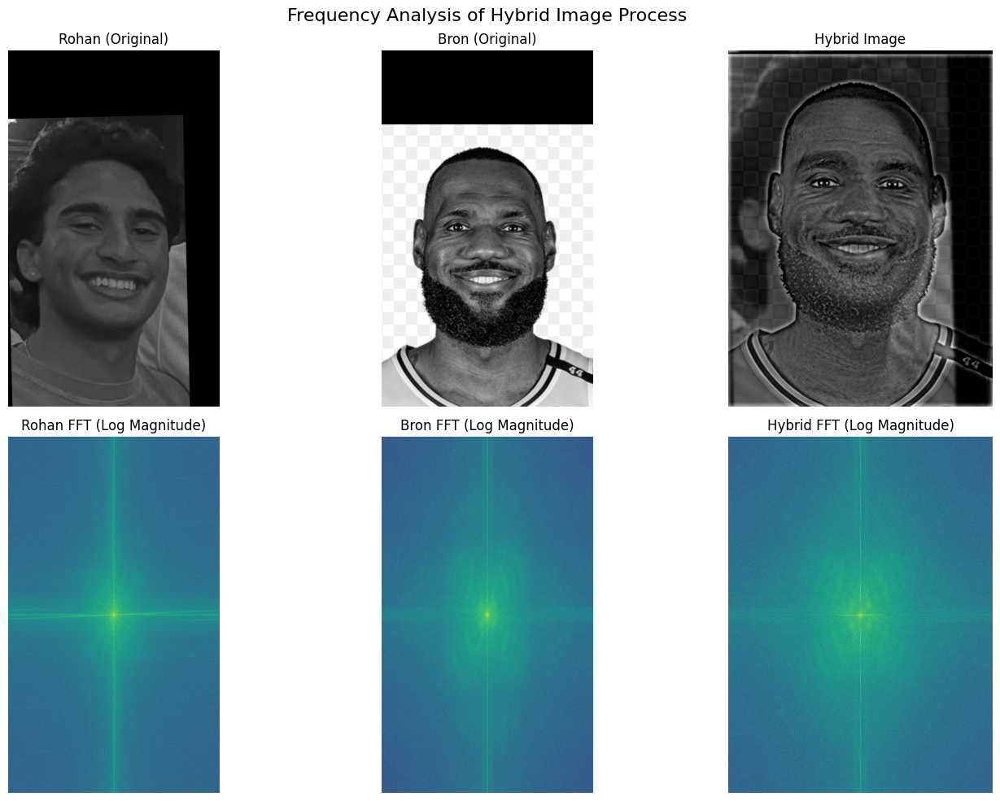

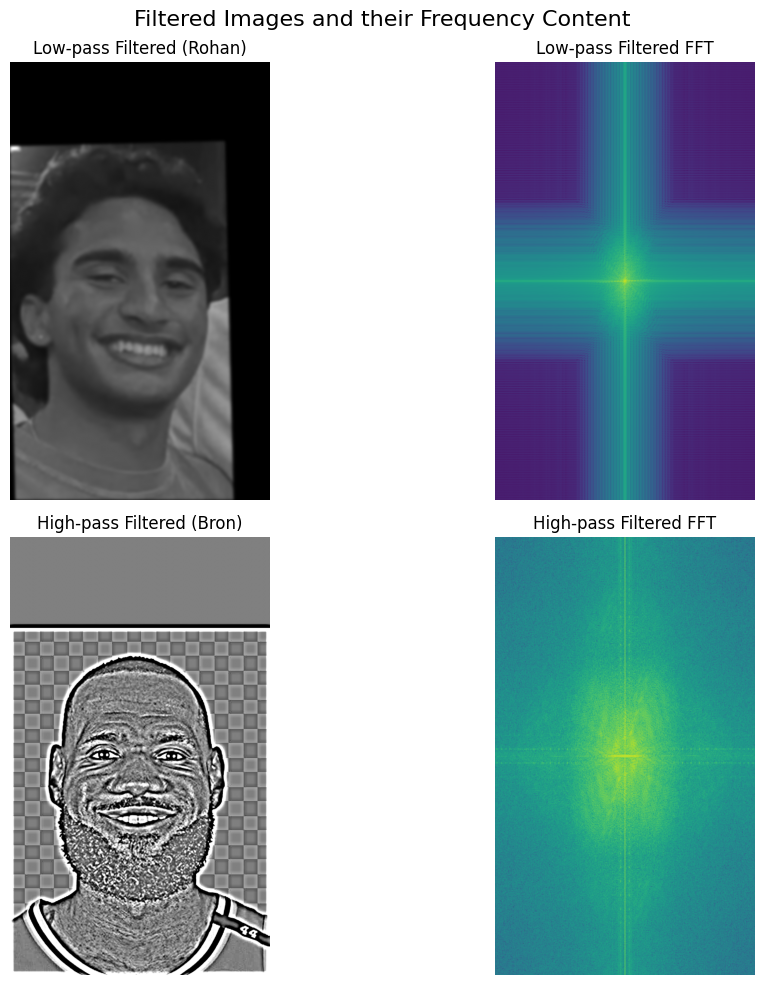

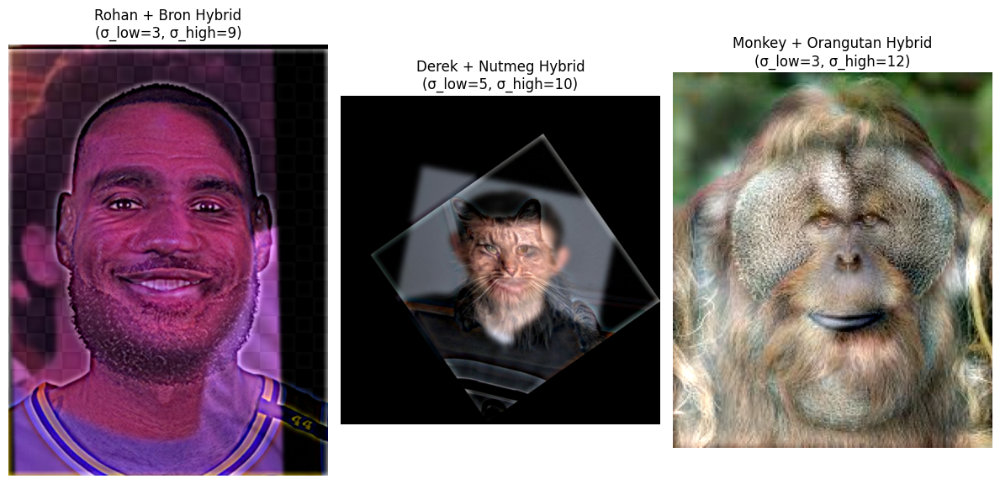

In [176]:
rohan_gray = color.rgb2gray(rohan_resized)
bron_gray = color.rgb2gray(bron_resized)
hybrid1_gray = color.rgb2gray(hybrid1)

rohan_low = np.zeros_like(rohan_resized)
bron_high = np.zeros_like(bron_resized)

for channel in range(3):
    rohan_low[:, :, channel] = built_in_convolve(rohan_resized[:, :, channel], low_gaussian_2d_rohan)
    blurred_channel = built_in_convolve(bron_resized[:, :, channel], high_gaussian_2d_rohan)
    bron_high[:, :, channel] = bron_resized[:, :, channel] - blurred_channel

rohan_low_gray = color.rgb2gray(rohan_low)
bron_high_gray = color.rgb2gray(bron_high)

fig_freq, axes_freq = plt.subplots(2, 3, figsize=(15, 10))

# Top row: Original images and hybrid
axes_freq[0, 0].imshow(rohan_gray, cmap='gray')
axes_freq[0, 0].set_title('Rohan (Original)')
axes_freq[0, 0].axis('off')

axes_freq[0, 1].imshow(bron_gray, cmap='gray')
axes_freq[0, 1].set_title('Bron (Original)')
axes_freq[0, 1].axis('off')

axes_freq[0, 2].imshow(hybrid1_gray, cmap='gray')
axes_freq[0, 2].set_title('Hybrid Image')
axes_freq[0, 2].axis('off')

axes_freq[1, 0].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rohan_gray)))))
axes_freq[1, 0].set_title('Rohan FFT (Log Magnitude)')
axes_freq[1, 0].axis('off')

axes_freq[1, 1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(bron_gray)))))
axes_freq[1, 1].set_title('Bron FFT (Log Magnitude)')
axes_freq[1, 1].axis('off')

axes_freq[1, 2].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(hybrid1_gray)))))
axes_freq[1, 2].set_title('Hybrid FFT (Log Magnitude)')
axes_freq[1, 2].axis('off')

plt.suptitle('Frequency Analysis of Hybrid Image Process', fontsize=16)
plt.tight_layout()
plt.show()

fig_filtered, axes_filtered = plt.subplots(2, 2, figsize=(12, 10))

axes_filtered[0, 0].imshow(rohan_low_gray, cmap='gray')
axes_filtered[0, 0].set_title('Low-pass Filtered (Rohan)')
axes_filtered[0, 0].axis('off')

axes_filtered[0, 1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(rohan_low_gray)))))
axes_filtered[0, 1].set_title('Low-pass Filtered FFT')
axes_filtered[0, 1].axis('off')

axes_filtered[1, 0].imshow(bron_high_gray, cmap='gray', vmin=-0.1, vmax=0.1)
axes_filtered[1, 0].set_title('High-pass Filtered (Bron)')
axes_filtered[1, 0].axis('off')

axes_filtered[1, 1].imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(bron_high_gray)))))
axes_filtered[1, 1].set_title('High-pass Filtered FFT')
axes_filtered[1, 1].axis('off')

plt.suptitle('Filtered Images and their Frequency Content', fontsize=16)
plt.tight_layout()
plt.show()

fig_hybrids, axes_hybrids = plt.subplots(1, 3, figsize=(12, 6))

axes_hybrids[0].imshow(hybrid1)
axes_hybrids[0].set_title(f'Rohan + Bron Hybrid\n(σ_low={low_freq_sigma_rohan}, σ_high={high_freq_sigma_rohan})')
axes_hybrids[0].axis('off')

axes_hybrids[1].imshow(hybrid2)
axes_hybrids[1].set_title(f'Derek + Nutmeg Hybrid\n(σ_low={low_freq_sigma_derek}, σ_high={high_freq_sigma_derek})')
axes_hybrids[1].axis('off')

axes_hybrids[2].imshow(hybrid3)
axes_hybrids[2].set_title(f'Monkey + Orangutan Hybrid\n(σ_low={low_freq_sigma_monkey}, σ_high={high_freq_sigma_monkey})')
axes_hybrids[2].axis('off')

plt.tight_layout()
plt.show()

## 2.3: Gaussian and Laplacian Stacks

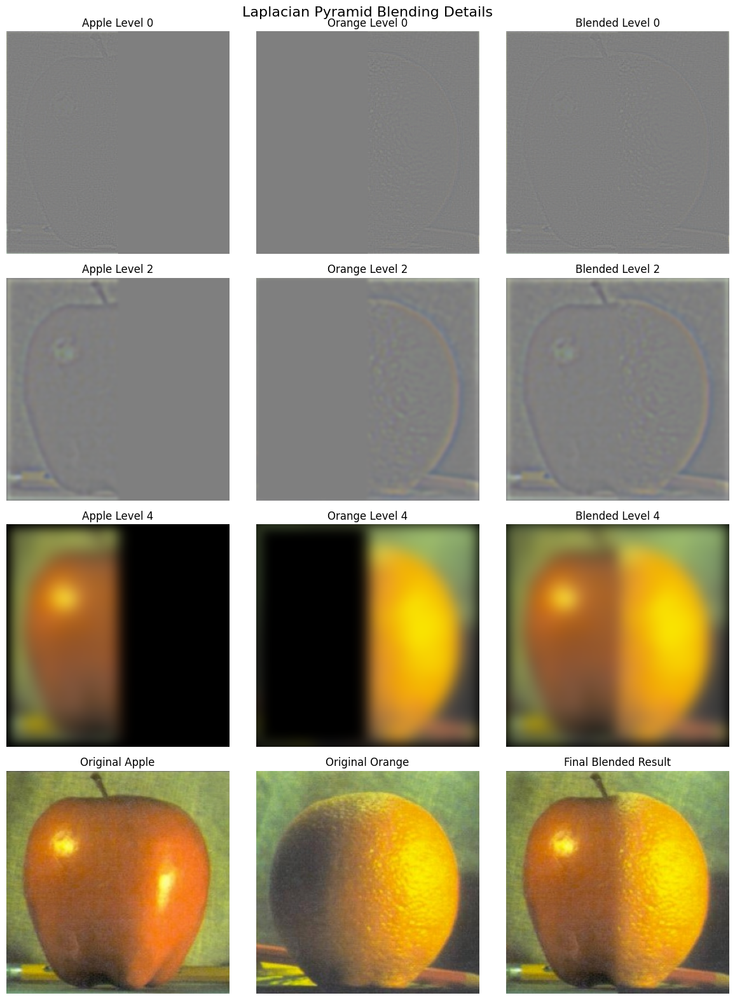

In [177]:
def gaussian_kernel(size, sigma):
    kernel = cv2.getGaussianKernel(size, sigma)
    return np.outer(kernel, kernel.T)

def create_gaussian_stack(image, levels=5):
    h, w, c = image.shape
    stack = []

    for level in range(levels):
        if level == 0:
            stack.append(image.copy())
        else:
            sigma = 2 ** (level - 1)
            kernel_size = int(6 * sigma + 1)
            if kernel_size % 2 == 0:
                kernel_size += 1

            gauss_kernel = gaussian_kernel(kernel_size, sigma)

            blurred_channels = []

            for channel in range(c):
                blurred_channels.append(built_in_convolve(stack[-1][:, :, channel], gauss_kernel))

            stack.append(np.stack(blurred_channels, axis=2))

    return stack

def create_laplacian_stack(gaussian_stack):
    laplacian_stack = []
    for i in range(len(gaussian_stack) - 1):
        laplacian = gaussian_stack[i] - gaussian_stack[i + 1]
        laplacian_stack.append(laplacian)
    laplacian_stack.append(gaussian_stack[-1])
    return laplacian_stack

def reconstruct_from_laplacian(laplacian_stack):
    reconstruction = laplacian_stack[-1].copy()
    for i in range(len(laplacian_stack) - 2, -1, -1):
        reconstruction += laplacian_stack[i]
    return reconstruction

apple = io.imread('../images/apple.jpeg')
orange = io.imread('../images/orange.jpeg')

apple = apple.astype(np.float32) / 255.0
orange = orange.astype(np.float32) / 255.0

min_h = min(apple.shape[0], orange.shape[0])
min_w = min(apple.shape[1], orange.shape[1])
apple = apple[:min_h, :min_w]
orange = orange[:min_w]

levels = 5

apple_gaussian_stack = create_gaussian_stack(apple, levels)
orange_gaussian_stack = create_gaussian_stack(orange, levels)

apple_laplacian_stack = create_laplacian_stack(apple_gaussian_stack)
orange_laplacian_stack = create_laplacian_stack(orange_gaussian_stack)


h, w = apple.shape[:2]
mask = np.zeros((h, w))
mask[:, :w//2] = 1.0 

mask_gaussian_stack = []
for level in range(levels):
    if level == 0:
        mask_gaussian_stack.append(mask.copy())
    else:
        sigma = 2 ** (level - 1)
        kernel_size = int(6 * sigma + 1)
        if kernel_size % 2 == 0:
            kernel_size += 1
        gauss_kernel = gaussian_kernel(kernel_size, sigma)
        blurred_mask = built_in_convolve(mask_gaussian_stack[-1], gauss_kernel)
        mask_gaussian_stack.append(blurred_mask)

display_levels = [0, 2, 4]
fig, axes = plt.subplots(4, 3, figsize=(12, 16))

for row, level in enumerate(display_levels):
    mask_3d = np.stack([mask_gaussian_stack[level]] * 3, axis=2)
    
    apple_weighted = mask_3d * apple_laplacian_stack[level]
    if level < levels - 1:  
        apple_display = apple_weighted + 0.5  
        apple_display = np.clip(apple_display, 0, 1)
    else:  
        apple_display = np.clip(apple_weighted, 0, 1)
    
    axes[row, 0].imshow(apple_display)
    axes[row, 0].set_title(f'Apple Level {level}' if row < 3 else 'Apple Final')
    axes[row, 0].axis('off')
    
    orange_weighted = (1 - mask_3d) * orange_laplacian_stack[level]
    if level < levels - 1:  
        orange_display = orange_weighted + 0.5  
        orange_display = np.clip(orange_display, 0, 1)
    else:  
        orange_display = np.clip(orange_weighted, 0, 1)
    
    axes[row, 1].imshow(orange_display)
    axes[row, 1].set_title(f'Orange Level {level}' if row < 3 else 'Orange Final')
    axes[row, 1].axis('off')
    
    blended_weighted = apple_weighted + orange_weighted
    if level < levels - 1:  
        blended_display = blended_weighted + 0.5  
        blended_display = np.clip(blended_display, 0, 1)
    else:  
        blended_display = np.clip(blended_weighted, 0, 1)
    
    axes[row, 2].imshow(blended_display)
    axes[row, 2].set_title(f'Blended Level {level}' if row < 3 else 'Blended Final')
    axes[row, 2].axis('off')

blended_laplacian_stack = []
for i in range(levels):
    mask_3d = np.stack([mask_gaussian_stack[i]] * 3, axis=2)
    blended_level = mask_3d * apple_laplacian_stack[i] + (1 - mask_3d) * orange_laplacian_stack[i]
    blended_laplacian_stack.append(blended_level)

apple_final = apple 
orange_final = orange
blended_final = reconstruct_from_laplacian(blended_laplacian_stack)

axes[3, 0].imshow(np.clip(apple_final, 0, 1))
axes[3, 0].set_title('Original Apple')
axes[3, 0].axis('off')

axes[3, 1].imshow(np.clip(orange_final, 0, 1))
axes[3, 1].set_title('Original Orange')
axes[3, 1].axis('off')

axes[3, 2].imshow(np.clip(blended_final, 0, 1))
axes[3, 2].set_title('Final Blended Result')
axes[3, 2].axis('off')

plt.suptitle('Laplacian Pyramid Blending Details', fontsize=16)
plt.tight_layout()
plt.show()

## 2.4: Multiresolution Blending

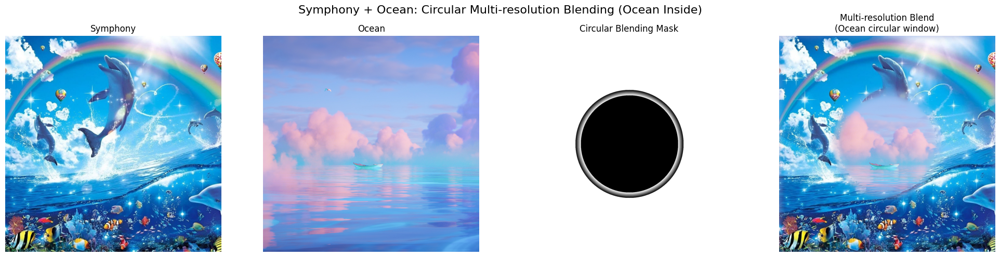

In [178]:
symphony = io.imread('../images/symphony.jpg').astype(np.float32) / 255.0
ocean = io.imread('../images/ocean_wallpaper.jpg').astype(np.float32) / 255.0

levels = 6

symphony_gaussian_stack = create_gaussian_stack(symphony, levels)
ocean_gaussian_stack = create_gaussian_stack(ocean, levels)

symphony_laplacian_stack = create_laplacian_stack(symphony_gaussian_stack)
ocean_laplacian_stack = create_laplacian_stack(ocean_gaussian_stack)

h, w = symphony.shape[:2]
center_y, center_x = h//2, w//2
radius = min(h, w) // 4

Y, X = np.ogrid[:h, :w]
dist_from_center = np.sqrt((X - center_x)**2 + (Y - center_y)**2)
circular_mask = (dist_from_center > radius).astype(float)  

feather_width = radius // 10  
for i in range(int(feather_width)):
    alpha = i / feather_width
    ring_mask = ((dist_from_center > radius - i - 1) & 
                 (dist_from_center <= radius - i))
    circular_mask[ring_mask] = alpha  

mask_gaussian_stack = []
for level in range(levels):
    if level == 0:
        mask_gaussian_stack.append(circular_mask.copy())
    else:
        sigma = 2 ** (level - 1)
        kernel_size = int(6 * sigma + 1)
        if kernel_size % 2 == 0:
            kernel_size += 1
        gauss_kernel = gaussian_kernel(kernel_size, sigma)
        blurred_mask = built_in_convolve(mask_gaussian_stack[-1], gauss_kernel)
        mask_gaussian_stack.append(blurred_mask)

blended_laplacian_stack = []
for i in range(levels):
    mask_3d = np.stack([mask_gaussian_stack[i]] * 3, axis=2)
    blended_level = mask_3d * symphony_laplacian_stack[i] + (1 - mask_3d) * ocean_laplacian_stack[i]
    blended_laplacian_stack.append(blended_level)

symphony_ocean_blend = reconstruct_from_laplacian(blended_laplacian_stack)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(np.clip(symphony, 0, 1))
axes[0].set_title('Symphony')
axes[0].axis('off')

axes[1].imshow(np.clip(ocean, 0, 1))
axes[1].set_title('Ocean')
axes[1].axis('off')

axes[2].imshow(circular_mask, cmap='gray')
axes[2].set_title('Circular Blending Mask')
axes[2].axis('off')

axes[3].imshow(np.clip(symphony_ocean_blend, 0, 1))
axes[3].set_title('Multi-resolution Blend\n(Ocean circular window)')
axes[3].axis('off')

plt.suptitle('Symphony + Ocean: Circular Multi-resolution Blending (Ocean Inside)', fontsize=16)
plt.tight_layout()
plt.show()

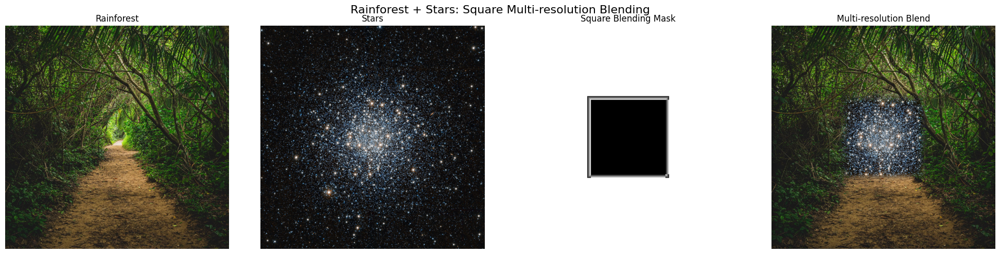

In [179]:
rainforest = io.imread('../images/forest.jpg').astype(np.float32) / 255.0
stars = io.imread('../images/stars.jpg').astype(np.float32) / 255.0

levels = 6

rainforest_gaussian_stack = create_gaussian_stack(rainforest, levels)
stars_gaussian_stack = create_gaussian_stack(stars, levels)

rainforest_laplacian_stack = create_laplacian_stack(rainforest_gaussian_stack)
stars_laplacian_stack = create_laplacian_stack(stars_gaussian_stack)

h, w = rainforest.shape[:2]
center_y, center_x = h//2, w//2
square_size = min(h, w) // 3  

square_mask = np.ones((h, w))  
start_y = center_y - square_size//2
end_y = center_y + square_size//2
start_x = center_x - square_size//2
end_x = center_x + square_size//2

start_y = max(0, start_y)
end_y = min(h, end_y)
start_x = max(0, start_x)
end_x = min(w, end_x)

square_mask[start_y:end_y, start_x:end_x] = 0.0  

feather_width = square_size // 20  

for i in range(int(feather_width)):
    if start_y - i - 1 >= 0:
        alpha = 1 - (i / feather_width)  
        square_mask[start_y - i - 1, start_x:end_x] = alpha

for i in range(int(feather_width)):
    if end_y + i < h:
        alpha = i / feather_width  
        square_mask[end_y + i, start_x:end_x] = alpha

for i in range(int(feather_width)):
    if start_x - i - 1 >= 0:
        alpha = 1 - (i / feather_width)  
        square_mask[start_y:end_y, start_x - i - 1] = alpha

for i in range(int(feather_width)):
    if end_x + i < w:
        alpha = i / feather_width  
        square_mask[start_y:end_y, end_x + i] = alpha

# Feather corners
for i in range(int(feather_width)):
    for j in range(int(feather_width)):
        alpha_i = 1 - (i / feather_width)  
        alpha_j = 1 - (j / feather_width)
        alpha = min(alpha_i, alpha_j)
        
        if start_y - i - 1 >= 0 and start_x - j - 1 >= 0:
            square_mask[start_y - i - 1, start_x - j - 1] = alpha
        
        if start_y - i - 1 >= 0 and end_x + j < w:
            square_mask[start_y - i - 1, end_x + j] = alpha
        
        if end_y + i < h and start_x - j - 1 >= 0:
            square_mask[end_y + i, start_x - j - 1] = alpha
        
        if end_y + i < h and end_x + j < w:
            square_mask[end_y + i, end_x + j] = alpha

mask_gaussian_stack = []
for level in range(levels):
    if level == 0:
        mask_gaussian_stack.append(square_mask.copy())
    else:
        sigma = 2 ** (level - 1)
        kernel_size = int(6 * sigma + 1)
        if kernel_size % 2 == 0:
            kernel_size += 1
        gauss_kernel = gaussian_kernel(kernel_size, sigma)
        blurred_mask = built_in_convolve(mask_gaussian_stack[-1], gauss_kernel)
        mask_gaussian_stack.append(blurred_mask)

blended_laplacian_stack = []
for i in range(levels):
    mask_3d = np.stack([mask_gaussian_stack[i]] * 3, axis=2)
    blended_level = mask_3d * rainforest_laplacian_stack[i] + (1 - mask_3d) * stars_laplacian_stack[i]
    blended_laplacian_stack.append(blended_level)

rainforest_stars_blend = reconstruct_from_laplacian(blended_laplacian_stack)

fig, axes = plt.subplots(1, 4, figsize=(20, 5))

axes[0].imshow(np.clip(rainforest, 0, 1))
axes[0].set_title('Rainforest')
axes[0].axis('off')

axes[1].imshow(np.clip(stars, 0, 1))
axes[1].set_title('Stars')
axes[1].axis('off')

axes[2].imshow(square_mask, cmap='gray')
axes[2].set_title('Square Blending Mask')
axes[2].axis('off')

axes[3].imshow(np.clip(rainforest_stars_blend, 0, 1))
axes[3].set_title('Multi-resolution Blend')
axes[3].axis('off')

plt.suptitle('Rainforest + Stars: Square Multi-resolution Blending', fontsize=16)
plt.tight_layout()
plt.show()